In [2]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/'CSCI5527 deep learning'/'Final_Project'/'Final_Project_Final'

Mounted at /content/drive
/content/drive/MyDrive/CSCI5527 deep learning/Final_Project/Final_Project_Final


In [3]:
import os
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [4]:
import os
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision import models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import copy # Not used in the provided snippet, but often used for deepcopying models or data
import random
from torch.nn.functional import softmax

# Define class names for binary classification
class_names = ['female', 'male']

# Define the image transformation pipeline.
# Our test images should be resized to 512x512 pixels.
transform = transforms.Compose([
    transforms.Resize((512, 512)),  # Resize the input image to 512x512 pixels.
    transforms.ToTensor(),         # Convert the PIL Image or numpy.ndarray to a PyTorch Tensor.
                                   # This also scales the image's pixel intensity values from [0, 255] to [0.0, 1.0].
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]) # Normalize the tensor image with mean and standard deviation.
                                                                               # These are standard values for models pre-trained on ImageNet.
])

# Function to load a pre-trained model
def load_model(model_path):
    # Create the model architecture (ResNet50)
    model = models.resnet50() # Initialize a ResNet50 model structure.
    # Modify the final fully connected layer to suit a binary classification task.
    num_ftrs = model.fc.in_features # Get the number of input features to the original fully connected layer.
    model.fc = nn.Linear(num_ftrs, len(class_names)) # Replace the original fully connected layer with a new one
                                                     # that has 'len(class_names)' output features (2 in this case).
    # Load the trained weights from the specified path.
    # map_location=device ensures the model is loaded onto the correct device (CPU or GPU).
    model.load_state_dict(torch.load(model_path, map_location=device))
    model = model.to(device) # Move the model to the specified device.
    model.eval()  # Set the model to evaluation mode. This disables layers like Dropout and BatchNorm updates.
    return model

# Function to get random images from the test set
def get_random_test_images(test_dir, num_images=5):
    images = [] # List to store image paths
    labels = [] # List to store corresponding labels

    # Define paths to the male and female image subdirectories
    male_path = os.path.join(test_dir, 'male')
    female_path = os.path.join(test_dir, 'female')

    # Collect male images
    if os.path.exists(male_path):
        # List all image files in the male directory
        male_images_paths = [os.path.join(male_path, img) for img in os.listdir(male_path)
                      if img.lower().endswith(('.png', '.jpg', '.jpeg'))] # Filter for common image file extensions
        if male_images_paths:
            # Select approximately half of the requested images from the male category
            for _ in range(num_images // 2):
                if male_images_paths: # Check if there are still images to choose from
                    img_path = random.choice(male_images_paths) # Randomly select an image path
                    male_images_paths.remove(img_path)  # Remove the selected image to avoid duplicates
                    images.append(img_path)
                    labels.append(1)  # Assign label 1 for male

    # Collect female images
    if os.path.exists(female_path):
        # List all image files in the female directory
        female_images_paths = [os.path.join(female_path, img) for img in os.listdir(female_path)
                        if img.lower().endswith(('.png', '.jpg', '.jpeg'))] # Filter for common image file extensions
        if female_images_paths:
            # Fill the remaining slots with female images to reach 'num_images'
            for _ in range(num_images - len(images)):
                if female_images_paths: # Check if there are still images to choose from
                    img_path = random.choice(female_images_paths) # Randomly select an image path
                    female_images_paths.remove(img_path)  # Remove the selected image to avoid duplicates
                    images.append(img_path)
                    labels.append(0)  # Assign label 0 for female

    # Shuffle the collected images and labels together to ensure randomness
    combined = list(zip(images, labels)) # Pair images with their labels
    random.shuffle(combined) # Shuffle the pairs
    if combined: # Check if the combined list is not empty before unpacking
        images, labels = zip(*combined) # Unzip into separate lists
    else:
        images, labels = [], []


    return images, labels

# Function to get the top N predicted classes and their probabilities
def top_classes(outputs, class_names, topk=2):
    # Apply softmax to the model outputs to get probabilities.
    # dim=1 means softmax is applied across the classes for each sample in the batch.
    probs = softmax(outputs, dim=1)
    # Get the top k probabilities and their corresponding class indices.
    # min(topk, len(class_names)) ensures k is not larger than the number of classes.
    values, indices = probs.topk(min(topk, len(class_names)))
    # Return a list of tuples, where each tuple is (class_name, probability).
    return [(class_names[idx], val.item()) for idx, val in zip(indices[0], values[0])]

# Gender Classification Model Test Script

This Python script tests a pre-trained ResNet50 model for gender classification (male/female) on sample images and shows the results.

**Purpose:**

The main goal is to check how well the current model predicts gender on a few test images. This helps understand its baseline accuracy before attempting to create adversarial examples (inputs designed to fool the classifier).

**How it Works (Simplified):**

1.  **Setup:**
    * It loads necessary tools for image handling, deep learning (PyTorch), and plotting.
    * Defines class names: `['female', 'male']`.
    * Sets up an image `transform`: resizes images to 512x512, converts them to tensors, and normalizes them using standard values.

2.  **Key Functions:**

    * **`load_model(model_path)`:**
        * Loads a ResNet50 model structure.
        * Changes its final layer to output 2 classes (for male/female).
        * Loads your trained weights from `model_path`.
        * Sets the model to "evaluation mode" (important for testing).

    * **`get_random_test_images(test_dir, num_images)`:**
        * Picks `num_images` random image files from `male` and `female` subfolders within your `test_dir`.
        * Returns a list of image paths and their true labels (0 for female, 1 for male).

    * **`top_classes(outputs, class_names, topk)`:**
        * Takes the model's raw output (`outputs`).
        * Converts scores to probabilities using `softmax`.
        * Returns the top `topk` predicted classes and their probabilities.

    * **`plot_prediction(img_path, outputs, class_names, true_label)`:**
        * Shows the original image.
        * Next to it, displays a bar chart of the model's predicted probabilities for "female" and "male".
        * Highlights the predicted class.
        * Indicates if the prediction was correct compared to `true_label`.

3.  **Main Steps:**

    * **Paths:** You set `model_path` (where your `.pth` model file is) and `test_dir` (where your test images are).
    * **Load Model:** The script calls `load_model()` to get your trained model ready.
    * **Get Images:** It calls `get_random_test_images()` to pick 5 random test images.
    * **Predict & Show:** For each image:
        1.  Opens and transforms the image for the model.
        2.  The model predicts the gender (`outputs = model(img_tensor)`).
        3.  Prints the true gender, predicted gender, and the model's confidence.
        4.  Calls `plot_prediction()` to show the image and the probability bars.
        5.  Saves the plot as an image file (e.g., `prediction_1.png`).
        6.  Prints if the prediction was "Correct" or "Incorrect".

**In short:** This script loads your gender classification model, feeds it a few random test images, and shows you how well it did on each, both in text and with a visual plot. This is a good first step to see if the model is working as expected before trying to "mislead" it with more advanced techniques.

Loading model...
Selecting random test images...

Analyzing test images...

Image 1:
File: 9276.jpg
True Class: male
Predicted Class: male
Confidence: 1.0000


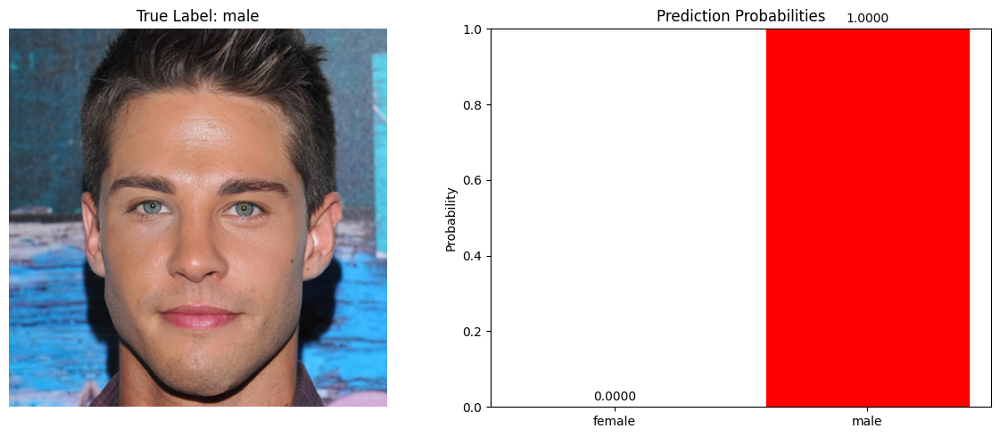

Prediction: Correct

Image 2:
File: 7818.jpg
True Class: female
Predicted Class: female
Confidence: 1.0000


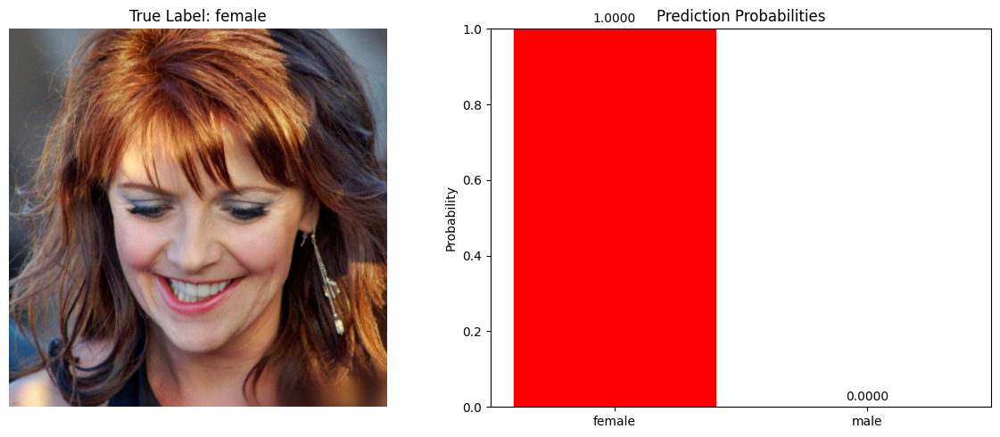

Prediction: Correct

Image 3:
File: 5511.jpg
True Class: female
Predicted Class: female
Confidence: 0.9984


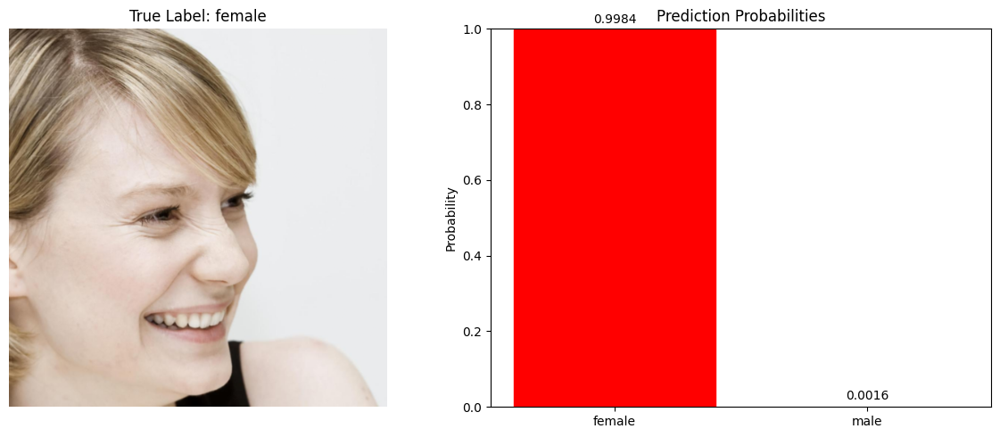

Prediction: Correct

Image 4:
File: 5874.jpg
True Class: male
Predicted Class: male
Confidence: 1.0000


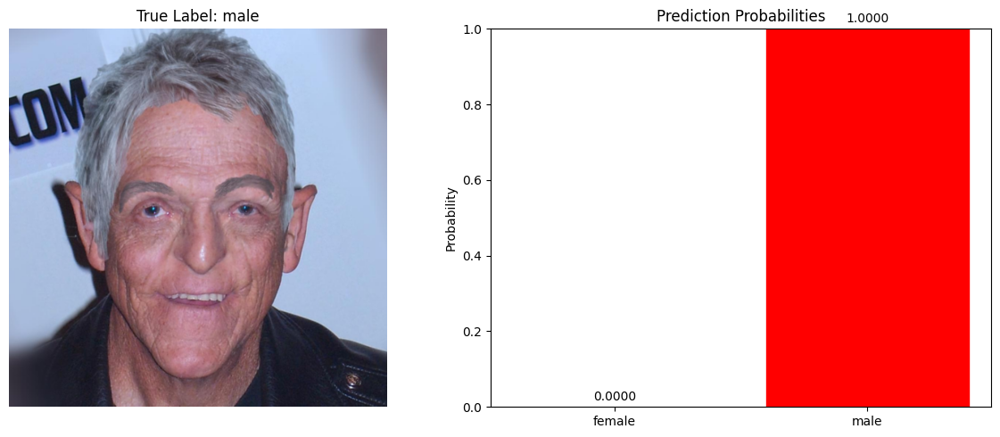

Prediction: Correct

Image 5:
File: 941.jpg
True Class: female
Predicted Class: female
Confidence: 1.0000


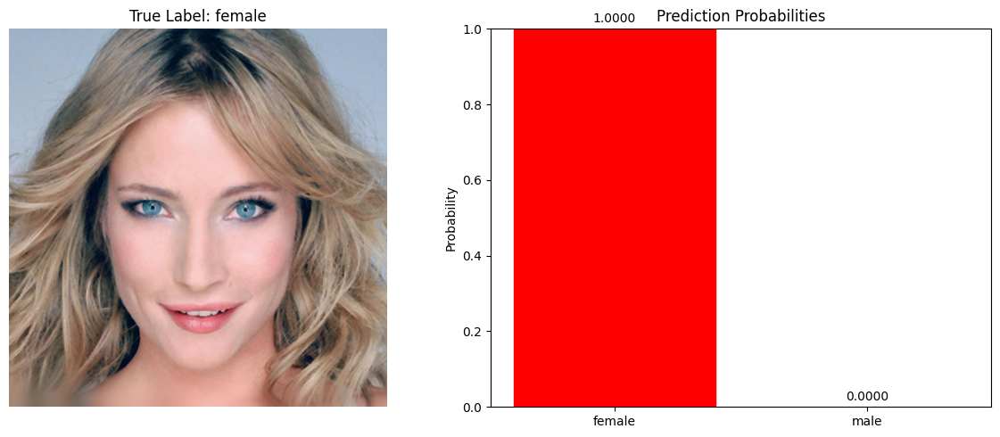

Prediction: Correct

Analysis complete!


In [6]:
import os
import torch
# (nn, transforms, models, Image, plt, np, softmax are used from previous imports)

# Define paths for the model and test dataset
model_path = 'gender_resnet50_model1.pth'  # Adjust to your saved model path
test_dir = 'CelebA_HQ_face_gender_dataset_test_1000'  # Adjust to your test set path

# --- Assuming 'device' and previous functions (load_model, get_random_test_images, transform, top_classes, plot_prediction, class_names) are defined ---
# It's good practice to define device here if it wasn't, for clarity:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the pre-trained model
print("Loading model...")
model = load_model(model_path) # Call function to load model structure and weights

# Get a list of random test images and their labels
print("Selecting random test images...")
images, labels = get_random_test_images(test_dir, num_images=5) # Get N random image paths and labels

def plot_prediction(img_tensor, outputs, class_names, true_label=None, title=None):
    # img_tensor is expected to be the normalized tensor, e.g., in [-1, 1] range
    # Prepare prediction probabilities
    probs = softmax(outputs, dim=1)[0].cpu().detach().numpy()

    # De-normalize image for display (assuming input was normalized to [-1,1] with mean=0.5, std=0.5)
    img = img_tensor.clone().cpu().detach().squeeze(0) # Remove batch dimension
    # These mean and std are for un-doing the normalization to [-1,1]
    # (input - 0.5) / 0.5 = normalized_input -> input = normalized_input * 0.5 + 0.5
    mean_display = torch.tensor([0.5, 0.5, 0.5]).view(3, 1, 1)
    std_display = torch.tensor([0.5, 0.5, 0.5]).view(3, 1, 1)
    img = img * std_display + mean_display # De-normalize
    img = img.clamp(0, 1) # Clamp to valid [0,1] range for imshow

    # Create figure
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Display image on the left
    axs[0].imshow(img.permute(1, 2, 0).numpy()) # CHW to HWC for matplotlib
    axs[0].axis('off')
    if true_label is not None:
        axs[0].set_title(f"True Label: {class_names[true_label]}")
    else:
        axs[0].set_title(title if title else "Input Image")

    # Display prediction bar chart on the right
    bars = axs[1].bar(class_names, probs)

    # Add probability labels to bars
    for bar, prob_val in zip(bars, probs): # Renamed prob to prob_val to avoid conflict
        height = bar.get_height()
        axs[1].text(bar.get_x() + bar.get_width() / 2, height + 0.01,
                    f'{prob_val:.4f}', ha='center', va='bottom')

    # Highlight the predicted class
    predicted_class_idx = int(torch.argmax(outputs, 1)) # Renamed for clarity
    bars[predicted_class_idx].set_color('red')

    # Set titles and axis labels
    axs[1].set_title("Prediction Probabilities")
    axs[1].set_ylim([0, 1])
    axs[1].set_ylabel("Probability")

    plt.tight_layout()

    # Determine whether prediction is correct
    is_correct = (predicted_class_idx == true_label) if true_label is not None else None

    # Return predicted class and probability
    max_prob_val = probs[predicted_class_idx] # Renamed for clarity
    predicted_label_name = class_names[predicted_class_idx] # Renamed for clarity

    return fig, is_correct, predicted_label_name, max_prob_val


# Analyze each selected test image
print("\nAnalyzing test images...")
for i, (img_path, label) in enumerate(zip(images, labels)): # Loop through each image path and its true label
    # Load and transform the current image
    img = Image.open(img_path).convert('RGB') # Open image and ensure it's RGB
    img_tensor = transform(img).unsqueeze(0).to(device) # Apply transformations, add batch dim, move to device

    # Get model predictions
    with torch.no_grad(): # Disable gradient calculations for inference
        outputs = model(img_tensor) # Pass image tensor through the model

    # Get the top predicted class and its confidence
    top_preds = top_classes(outputs, class_names) # Get top N predictions (default N=2)
    pred_class_name = top_preds[0][0] # Name of the class with highest probability
    confidence = top_preds[0][1]   # Probability of the top predicted class

    # Display true and predicted class information
    true_class_name = class_names[label] # Get true class name from label index
    print(f"\nImage {i+1}:")
    print(f"File: {os.path.basename(img_path)}") # Print filename
    print(f"True Class: {true_class_name}")
    print(f"Predicted Class: {pred_class_name}")
    print(f"Confidence: {confidence:.4f}")

    # Visualize the image and prediction probabilities
    # plot_prediction returns: fig, is_correct, predicted_label_name_from_plot, max_prob_from_plot
    fig, is_correct, _, _ = plot_prediction(img_tensor, outputs, class_names, label)
    plt.show() # Display the plot

    # Print prediction result (Correct/Incorrect)
    result_string = "Correct" if is_correct else "Incorrect"
    print(f"Prediction: {result_string}")

print("\nAnalysis complete!")

##We can see the the model we trained is very high efficient!

### Performing a simple attack with FGSM on Gender Classification

We now try the Fast Gradient Sign Method (FGSM) to attack our gender classification model. The key equation is:

$$ \mathbf{\eta} = \epsilon \cdot \textrm{sign}(\nabla_\mathbf{x} J(\mathbf{\theta}, \mathbf{x}, y)) $$

For the cost function $J$, we use `CrossEntropyLoss` which was also used during the training of our gender classification models. The `sign` function finds the element-wise sign of the vector, and this is already implemented in PyTorch.

According to the documentation of `ToTensor`, when transforming a PIL image to a tensor, the values are put in the range `0.0` to `1.0`, so we would like our output ($\textrm{input}+ \eta$) to also be in this range. We therefore compute:

$$
\textrm{new image} = f(\mathbf{x} + \mathbf{\eta})
$$

where $f$ is a clamping function:

$$ f = \left\{ \begin{array}{2}
1.0 & \textrm{if } x > 1.0 \\
0.0 & \textrm{if } x < 0.0 \\
x & \textrm{otherwise} \end{array}\right. $$

This attack method can cause our gender classification model to misclassify between male and female by adding perturbations that are nearly imperceptible to the human eye, thereby testing the model's robustness.


In [11]:
# Implement FGSM attack function (for binary classification problems)
# Implement FGSM attack function (for normalized image tensors)
def fgsm(img_tensor_normalized, grad, epsilon): # Input is normalized tensor
    """
    Add FGSM perturbation to normalized images
    """
    signs = grad.sign()
    perturbed_input_normalized = img_tensor_normalized + epsilon * signs # epsilon should be relative to the scale of normalized data

    # --- Key modification: Clip in normalized space ---
    # Estimate min and max values after normalization, e.g.:
    min_vals = torch.tensor([(0-0.5)/0.229, (0-0.5)/0.224, (0-0.5)/0.225]).view(3, 1, 1).to(img_tensor_normalized.device)
    max_vals = torch.tensor([(1-0.5)/0.229, (1-0.5)/0.224, (1-0.5)/0.225]).view(3, 1, 1).to(img_tensor_normalized.device)
    # Ensure each channel of perturbed_input_normalized is between its corresponding min_val and max_val
    # For simplicity, a uniform approximate range can also be used, like torch.clamp(perturbed_input_normalized, -2.5, 2.5)
    # But clipping by channel is more accurate
    perturbed_input_normalized_clamped = torch.max(torch.min(perturbed_input_normalized, max_vals), min_vals)

    return perturbed_input_normalized_clamped.detach()

def fgsm_attack(model, img_tensor, true_label, epsilon=0.03, criterion=nn.BCEWithLogitsLoss()):
    """
    Perform FGSM adversarial attack on image (for binary classification problems)

    Parameters:
    model: Trained model
    img_tensor: Input image tensor
    true_label: True class label (0 or 1)
    epsilon: Perturbation size
    criterion: Loss function (using BCEWithLogitsLoss instead of CrossEntropyLoss)

    Returns:
    perturbed_img: Perturbed image tensor
    perturbation: Added perturbation
    """
    # Create binary classification label tensor (float type)
    target = torch.tensor([float(true_label)]).to(device)

    # Enable gradient calculation
    img_tensor.requires_grad = True

    # Forward pass
    output = model(img_tensor)

    # If model output has two class logits, take the last dimension as binary classification output
    if output.shape[1] == 2:
        output = output[:, 1]  # Take the logit of the second class as binary classification output

    # Calculate binary classification loss
    loss = criterion(output, target)

    # Backpropagation
    model.zero_grad()
    loss.backward()

    # Get gradient
    data_grad = img_tensor.grad.data

    # Generate perturbation
    perturbed_img = fgsm(img_tensor, data_grad, epsilon)

    # Calculate added perturbation
    perturbation = perturbed_img - img_tensor.detach()

    return perturbed_img, perturbation

def plot_prediction(img_tensor, outputs, class_names, true_label=None, title=None):
    # Prepare prediction probabilities
    probs = softmax(outputs, dim=1)[0].cpu().detach().numpy()

    # De-normalize image for display
    img = img_tensor.clone().cpu().detach().squeeze(0)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = img * std + mean
    img = img.clamp(0, 1)

    # Create figure
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Display image on the left
    axs[0].imshow(img.permute(1, 2, 0).numpy())
    axs[0].axis('off')
    if true_label is not None:
        axs[0].set_title(f"True Label: {class_names[true_label]}")
    else:
        axs[0].set_title(title if title else "Input Image")

    # Display prediction bar chart on the right
    bars = axs[1].bar(class_names, probs)

    # Add probability labels to bars
    for bar, prob in zip(bars, probs):
        height = bar.get_height()
        axs[1].text(bar.get_x() + bar.get_width() / 2, height + 0.01,
                    f'{prob:.4f}', ha='center', va='bottom')

    # Highlight the predicted class
    predicted_class = int(torch.argmax(outputs, 1))
    bars[predicted_class].set_color('red')

    # Set titles and axis labels
    axs[1].set_title("Prediction Probabilities")
    axs[1].set_ylim([0, 1])
    axs[1].set_ylabel("Probability")

    plt.tight_layout()

    # Determine whether prediction is correct
    is_correct = (predicted_class == true_label) if true_label is not None else None

    # Return predicted class and probability
    max_prob = probs[predicted_class]
    predicted_label = class_names[predicted_class]

    return fig, is_correct, predicted_label, max_prob

Selecting random test images...

Analyzing test images and generating adversarial examples...

----- Image 1: 9607.jpg -----

Original Image Analysis:
True Label: female
Predicted Label: female
Prediction Confidence: 1.0000


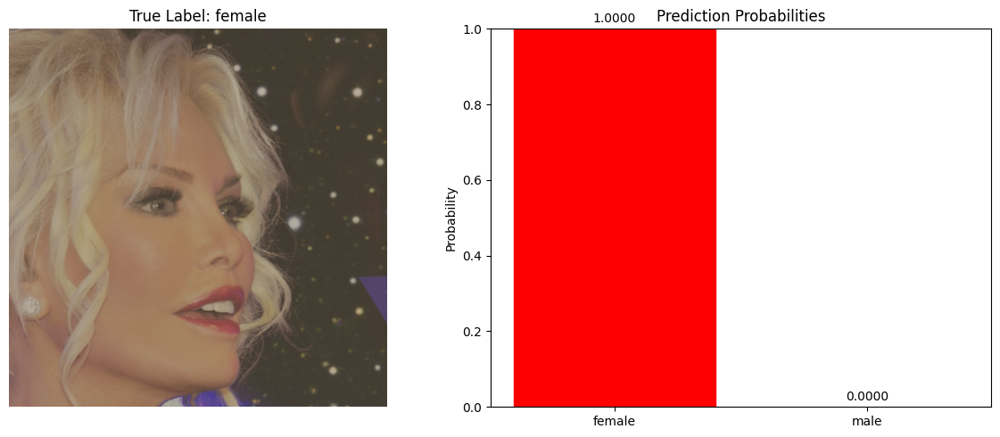


Generating adversarial example...

Adversarial Image Analysis:
True Label: female
Predicted Label: male
Prediction Confidence: 1.0000


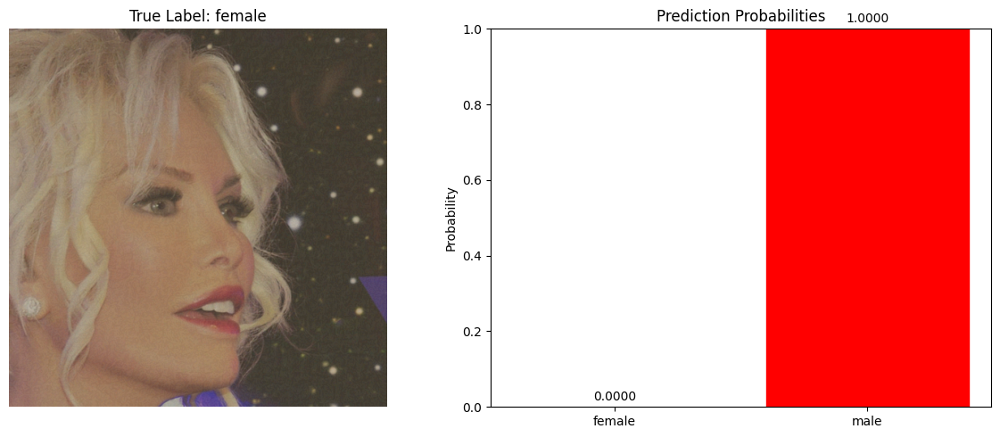

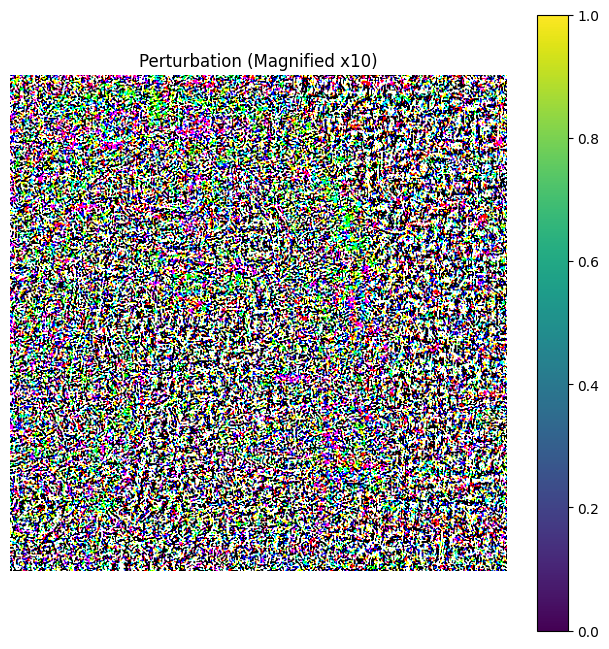

Attack Result: Success

----- Image 2: 6308.jpg -----

Original Image Analysis:
True Label: male
Predicted Label: male
Prediction Confidence: 0.9944


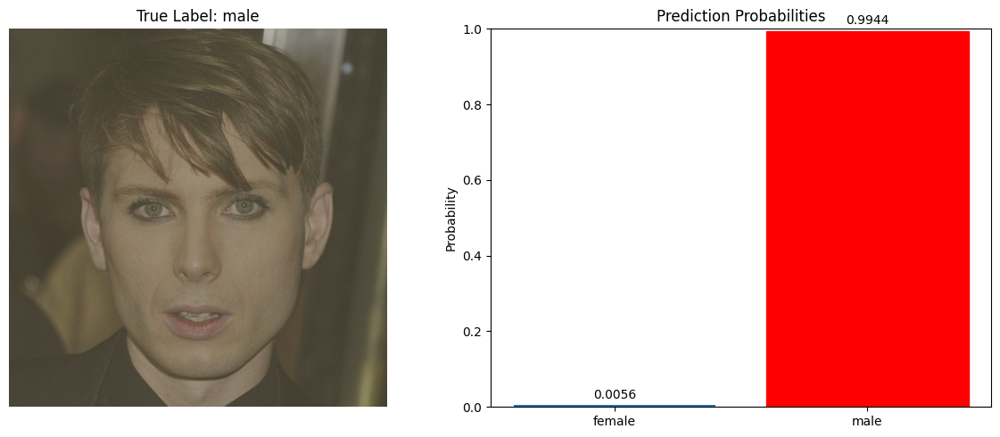


Generating adversarial example...

Adversarial Image Analysis:
True Label: male
Predicted Label: female
Prediction Confidence: 1.0000


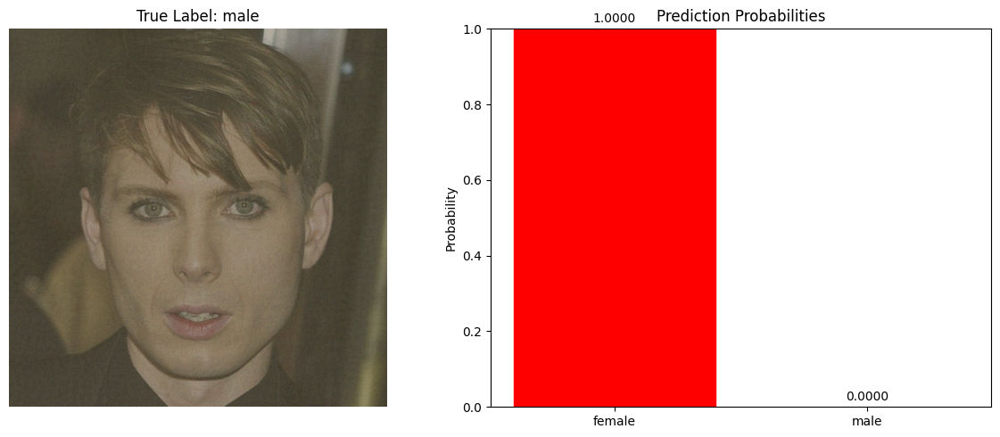

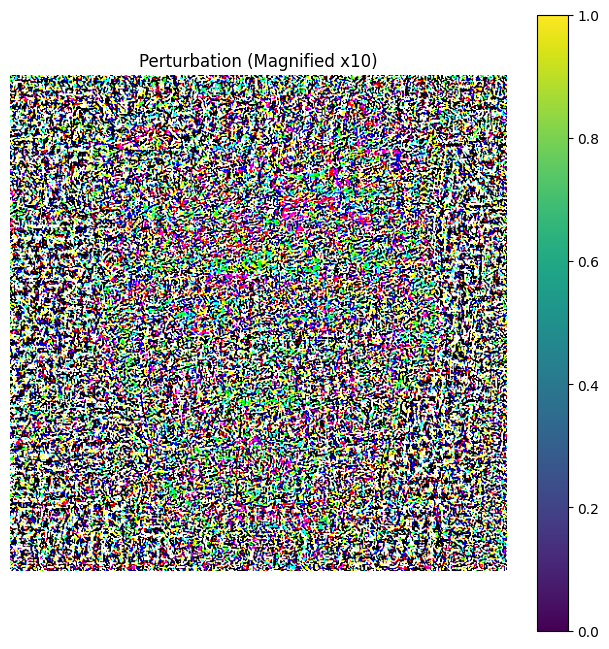

Attack Result: Success

----- Image 3: 8085.jpg -----

Original Image Analysis:
True Label: female
Predicted Label: female
Prediction Confidence: 1.0000


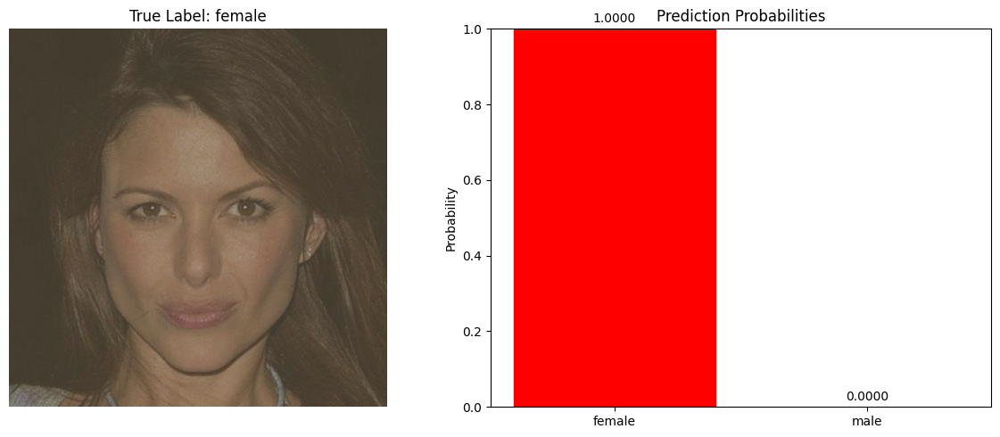


Generating adversarial example...

Adversarial Image Analysis:
True Label: female
Predicted Label: male
Prediction Confidence: 1.0000


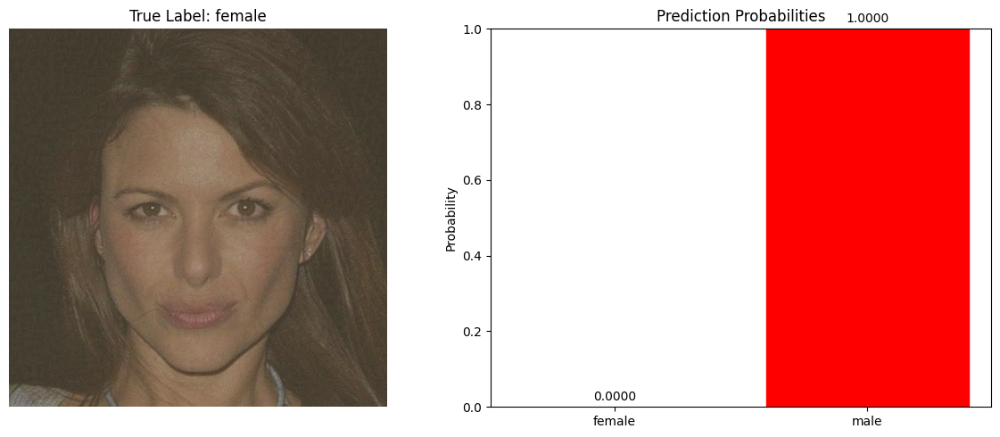

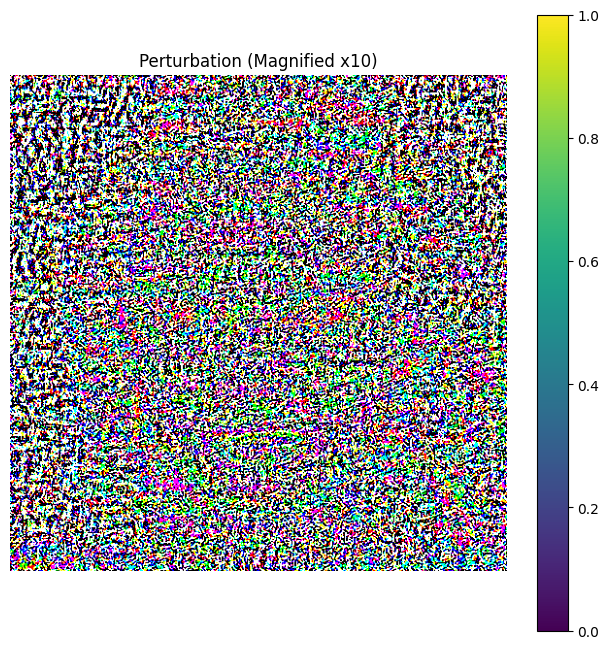

Attack Result: Success

----- Image 4: 4660.jpg -----

Original Image Analysis:
True Label: male
Predicted Label: female
Prediction Confidence: 0.9981


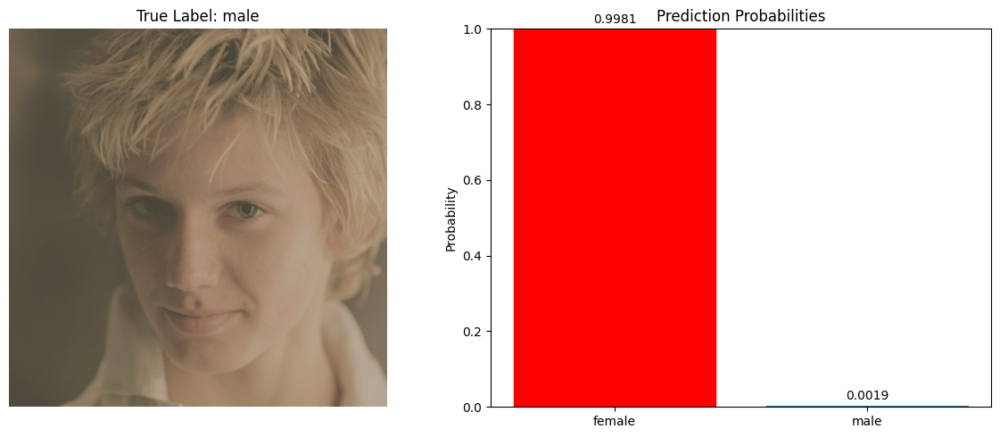

Original image misclassified, skipping attack.

----- Image 5: 9846.jpg -----

Original Image Analysis:
True Label: female
Predicted Label: female
Prediction Confidence: 1.0000


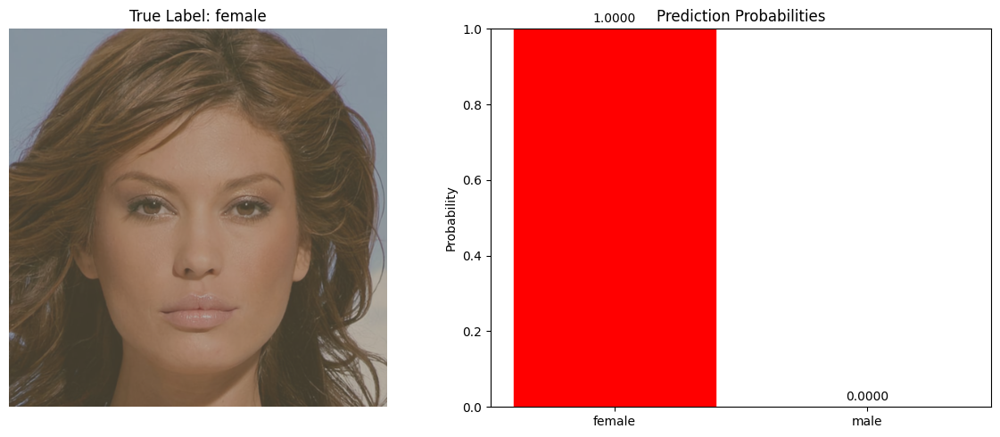


Generating adversarial example...

Adversarial Image Analysis:
True Label: female
Predicted Label: male
Prediction Confidence: 1.0000


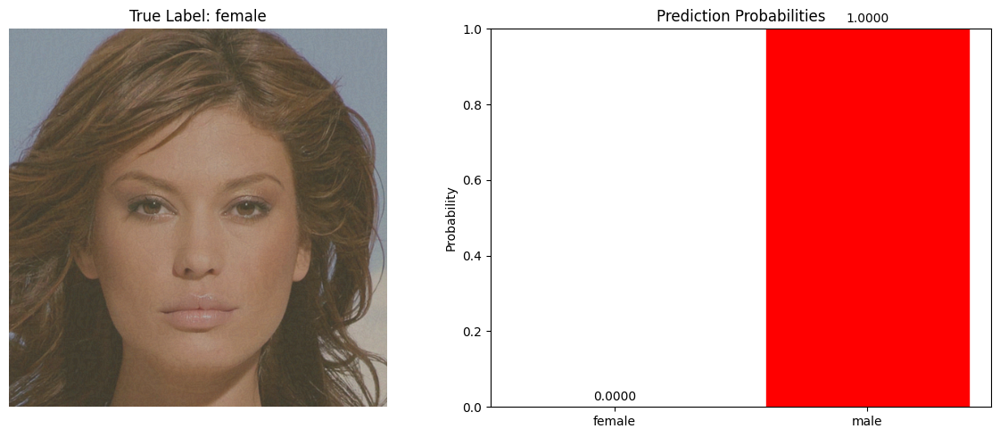

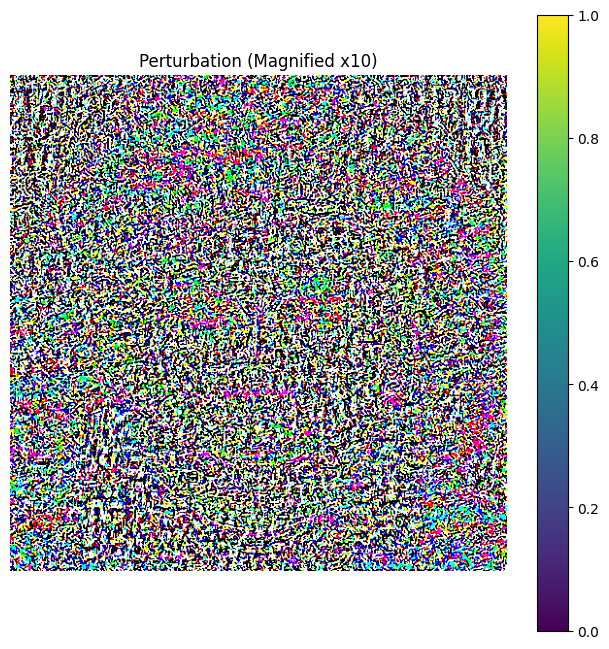

Attack Result: Success

Analysis complete!


In [8]:
# Define perturbation magnitude
epsilon = 0.05  # Try different values: 0.01, 0.03, 0.05, 0.1


# Get random test images
print("Selecting random test images...")
images, labels = get_random_test_images(test_dir, num_images=5)

# Analyze each image
print("\nAnalyzing test images and generating adversarial examples...")
for i, (img_path, label) in enumerate(zip(images, labels)):
    print(f"\n----- Image {i+1}: {os.path.basename(img_path)} -----")

    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)

    # 1. Analyze original image
    print("\nOriginal Image Analysis:")
    with torch.no_grad():
        original_output = model(img_tensor)

    # Get original prediction
    original_preds = top_classes(original_output, class_names)
    original_class = original_preds[0][0]
    original_confidence = original_preds[0][1]

    print(f"True Label: {class_names[label]}")
    print(f"Predicted Label: {original_class}")
    print(f"Prediction Confidence: {original_confidence:.4f}")

    # Visualize original prediction
    fig, is_correct, _, _ = plot_prediction(img_tensor, original_output, class_names, label, "Original Image")
    plt.show()

    # Only attack correctly classified images
    if is_correct:
        print("\nGenerating adversarial example...")

        # 2. Generate adversarial example
        perturbed_img, perturbation = fgsm_attack(model, img_tensor.clone(), label, epsilon)

        # 3. Analyze adversarial example
        with torch.no_grad():
            adversarial_output = model(perturbed_img)

        # Get adversarial prediction
        adversarial_preds = top_classes(adversarial_output, class_names)
        adversarial_class = adversarial_preds[0][0]
        adversarial_confidence = adversarial_preds[0][1]

        print("\nAdversarial Image Analysis:")
        print(f"True Label: {class_names[label]}")
        print(f"Predicted Label: {adversarial_class}")
        print(f"Prediction Confidence: {adversarial_confidence:.4f}")

        # Visualize adversarial prediction
        fig, is_adv_correct, _, _ = plot_prediction(perturbed_img, adversarial_output, class_names, label,
                                                    f"Adversarial Image (ε = {epsilon})")
        plt.show()

        # Visualize perturbation (magnified for visibility)
        perturbation = perturbation.squeeze(0).cpu() * 10
        plt.figure(figsize=(8, 8))
        plt.imshow(perturbation.detach().permute(1, 2, 0).numpy() + 0.5)
        plt.title("Perturbation (Magnified x10)")
        plt.colorbar()
        plt.axis('off')
        plt.show()

        # Show attack result
        attack_success = not is_adv_correct
        print(f"Attack Result: {'Success' if attack_success else 'Failure'}")
    else:
        print("Original image misclassified, skipping attack.")

print("\nAnalysis complete!")


In [9]:
# Define adversarial robustness evaluation
def evaluate_adversarial_robustness(model, test_dir, class_names, device, batch_size=32):
    """
    Evaluate model robustness against FGSM attacks on test dataset.

    Args:
        model: Trained model
        test_dir: Path to test dataset
        class_names: List of class names
        device: Torch device
        batch_size: Batch size for evaluation

    Returns:
        epsilons: List of epsilon values used for attacks
        accuracies: Accuracy at each epsilon level
    """
    print("Starting adversarial robustness evaluation...")

    # Load image paths
    male_path = os.path.join(test_dir, 'male')
    female_path = os.path.join(test_dir, 'female')

    male_images = [os.path.join(male_path, f) for f in os.listdir(male_path)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    female_images = [os.path.join(female_path, f) for f in os.listdir(female_path)
                     if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    all_images = female_images + male_images
    all_labels = [0] * len(female_images) + [1] * len(male_images)

    if len(all_images) > 1000:
        indices = random.sample(range(len(all_images)), 1000)
        all_images = [all_images[i] for i in indices]
        all_labels = [all_labels[i] for i in indices]

    print(f"Loaded {len(all_images)} test images")
    print(f"Female: {all_labels.count(0)}, Male: {all_labels.count(1)}")

    epsilons = [0, 0.005, 0.01, 0.02, 0.03]
    accuracies = []

    model.eval()

    for epsilon in epsilons:
        print(f"\nEvaluating with epsilon = {epsilon}...")
        correct = 0
        total = 0

        for i in range(0, len(all_images), batch_size):
            batch_images = all_images[i:i + batch_size]
            batch_labels = all_labels[i:i + batch_size]

            for img_path, label in zip(batch_images, batch_labels):
                img = Image.open(img_path).convert('RGB')
                img_tensor = transform(img).unsqueeze(0).to(device)

                if epsilon == 0:
                    with torch.no_grad():
                        outputs = model(img_tensor)
                    _, predicted = torch.max(outputs, 1)
                else:
                    perturbed_img, _ = fgsm_attack(model, img_tensor.clone(), label, epsilon)
                    with torch.no_grad():
                        outputs = model(perturbed_img)
                    _, predicted = torch.max(outputs, 1)

                total += 1
                if predicted.item() == label:
                    correct += 1

                if total % 100 == 0:
                    print(f"  Processed {total}/{len(all_images)} images, accuracy so far: {100 * correct / total:.2f}%")

        accuracy = 100 * correct / total
        accuracies.append(accuracy)
        print(f"Epsilon = {epsilon}, Accuracy: {accuracy:.2f}%")

    return epsilons, accuracies


def plot_robustness_results(epsilons, accuracies):
    """
    Plot accuracy vs. epsilon (perturbation magnitude)
    """
    plt.figure(figsize=(10, 6))
    plt.plot(epsilons, accuracies, 'o-', linewidth=2, markersize=8)
    plt.title('Adversarial Robustness: Accuracy vs. Perturbation (ε)', fontsize=14)
    plt.xlabel('Perturbation Magnitude (ε)', fontsize=12)
    plt.ylabel('Accuracy (%)', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)

    for i, acc in enumerate(accuracies):
        plt.annotate(f'{acc:.2f}%',
                     (epsilons[i], acc),
                     textcoords="offset points",
                     xytext=(0, 10),
                     ha='center',
                     fontsize=10)

    plt.tight_layout()
    plt.show()


def display_adversarial_examples(model, images, labels, class_names, epsilon=0.03, device=None):
    """
    Display examples of adversarial attacks
    """
    for i, (img_path, label) in enumerate(zip(images, labels)):
        print(f"\nExample {i+1}: {os.path.basename(img_path)}")

        img = Image.open(img_path).convert('RGB')
        img_tensor = transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            original_output = model(img_tensor)
        _, original_pred = torch.max(original_output, 1)

        perturbed_img, perturbation = fgsm_attack(model, img_tensor.clone(), label, epsilon)

        with torch.no_grad():
            adversarial_output = model(perturbed_img)
        _, adversarial_pred = torch.max(adversarial_output, 1)

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        # De-normalize image
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

        orig_img = img_tensor.cpu().squeeze(0) * std + mean
        orig_img = orig_img.clamp(0, 1)
        axes[0].imshow(orig_img.permute(1, 2, 0).numpy())
        axes[0].set_title(f'Original\nPrediction: {class_names[original_pred.item()]}')
        axes[0].axis('off')

        adv_img = perturbed_img.cpu().squeeze(0) * std + mean
        adv_img = adv_img.clamp(0, 1)
        axes[1].imshow(adv_img.permute(1, 2, 0).numpy())
        correct = "✓" if adversarial_pred.item() == label else "✗"
        axes[1].set_title(f'Adversarial (ε={epsilon})\nPrediction: {class_names[adversarial_pred.item()]} {correct}')
        axes[1].axis('off')

        # Normalize and display perturbation
        pert = perturbation.squeeze(0).cpu()
        pert = (pert - pert.min()) / (pert.max() - pert.min() + 1e-8)
        axes[2].imshow(pert.permute(1, 2, 0).numpy())
        axes[2].set_title('Perturbation (Magnified)')
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

        # Print prediction results
        print(f"True Label: {class_names[label]}")
        print(f"Original Prediction: {class_names[original_pred.item()]}")
        print(f"Adversarial Prediction: {class_names[adversarial_pred.item()]}")
        if original_pred.item() == adversarial_pred.item():
            print("Attack Result: Failed (prediction unchanged)")
        else:
            print("Attack Result: Success (prediction changed)")


def run_adversarial_evaluation(model_path, test_dir, class_names, device):
    """
    Load the model and run adversarial robustness evaluation
    """
    print("Loading model...")
    model = load_model(model_path)

    epsilons, accuracies = evaluate_adversarial_robustness(model, test_dir, class_names, device)
    plot_robustness_results(epsilons, accuracies)

    print("\nDisplaying adversarial example cases...")
    images, labels = get_random_test_images(test_dir, num_images=5)
    display_adversarial_examples(model, images, labels, class_names, epsilon=0.03, device=device)


Loading model...
Starting adversarial robustness evaluation...
Loaded 1000 test images
Female: 500, Male: 500

Evaluating with epsilon = 0...
  Processed 100/1000 images, accuracy so far: 97.00%
  Processed 200/1000 images, accuracy so far: 97.00%
  Processed 300/1000 images, accuracy so far: 97.67%
  Processed 400/1000 images, accuracy so far: 98.00%
  Processed 500/1000 images, accuracy so far: 98.20%
  Processed 600/1000 images, accuracy so far: 97.83%
  Processed 700/1000 images, accuracy so far: 98.00%
  Processed 800/1000 images, accuracy so far: 97.38%
  Processed 900/1000 images, accuracy so far: 97.22%
  Processed 1000/1000 images, accuracy so far: 97.20%
Epsilon = 0, Accuracy: 97.20%

Evaluating with epsilon = 0.005...
  Processed 100/1000 images, accuracy so far: 13.00%
  Processed 200/1000 images, accuracy so far: 17.00%
  Processed 300/1000 images, accuracy so far: 17.67%
  Processed 400/1000 images, accuracy so far: 18.25%
  Processed 500/1000 images, accuracy so far: 20.

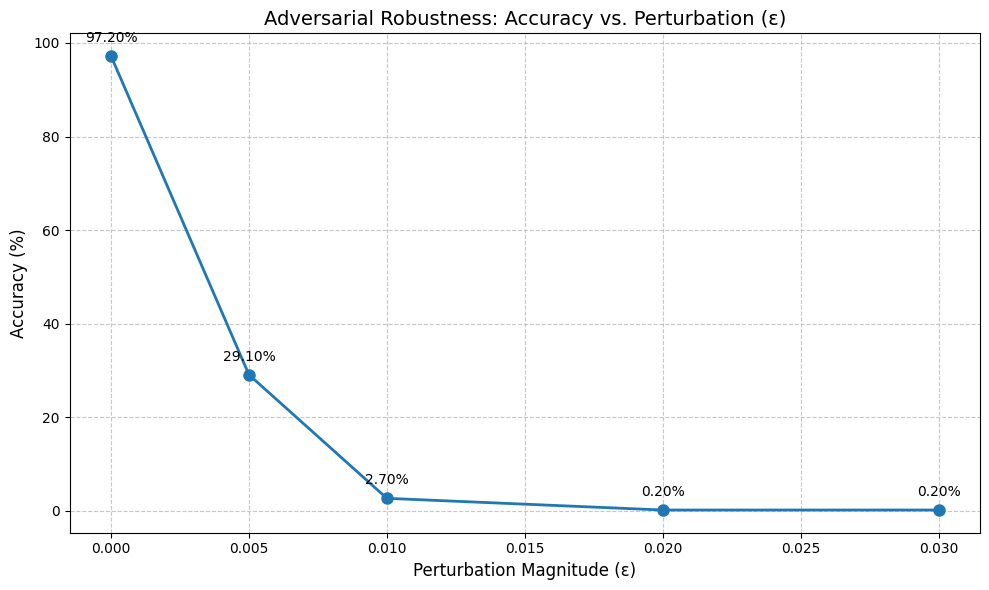


Displaying adversarial example cases...

Example 1: 9735.jpg


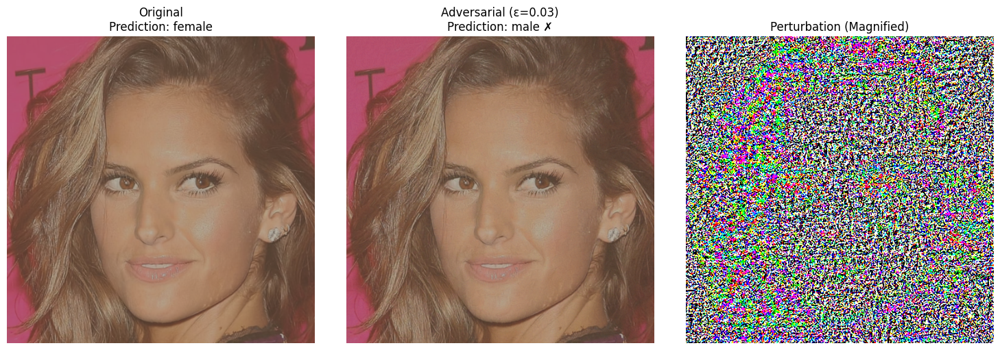

True Label: female
Original Prediction: female
Adversarial Prediction: male
Attack Result: Success (prediction changed)

Example 2: 6378.jpg


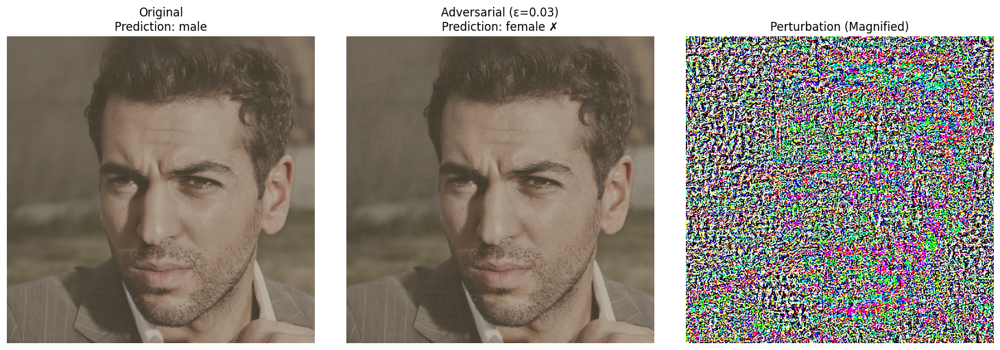

True Label: male
Original Prediction: male
Adversarial Prediction: female
Attack Result: Success (prediction changed)

Example 3: 9179.jpg


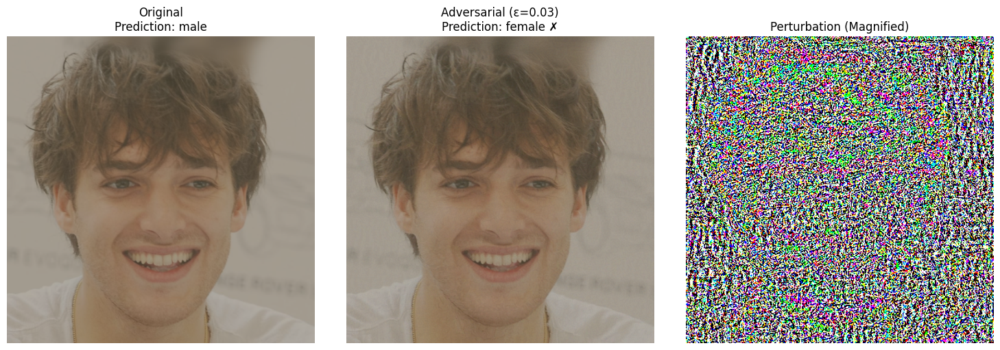

True Label: male
Original Prediction: male
Adversarial Prediction: female
Attack Result: Success (prediction changed)

Example 4: 8851.jpg


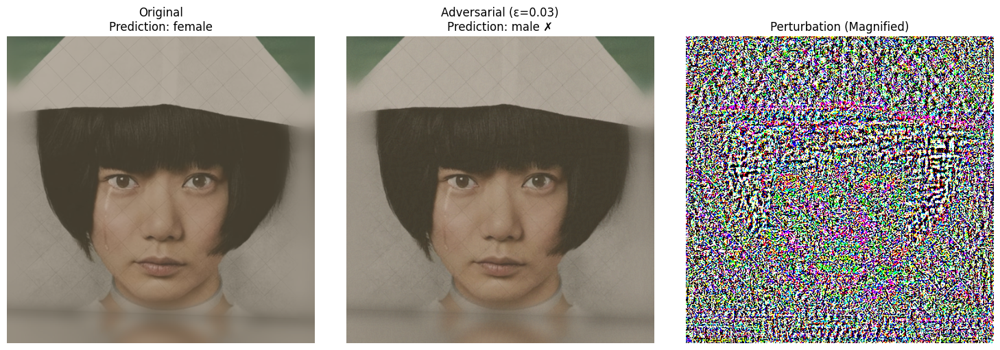

True Label: female
Original Prediction: female
Adversarial Prediction: male
Attack Result: Success (prediction changed)

Example 5: 7582.jpg


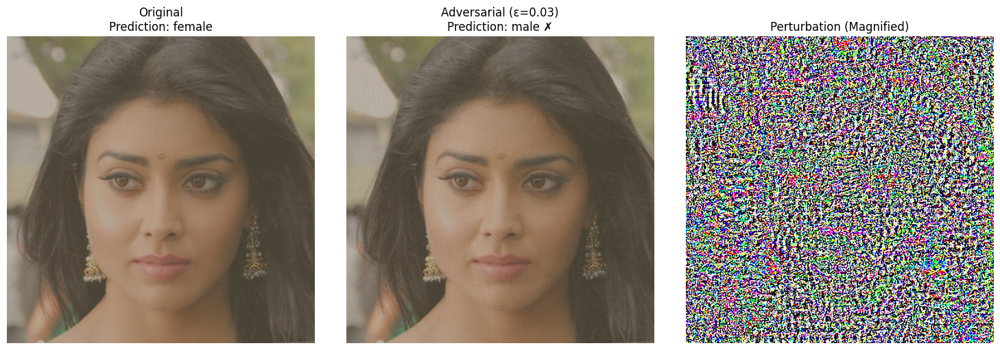

True Label: female
Original Prediction: female
Adversarial Prediction: male
Attack Result: Success (prediction changed)


In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_path = 'gender_resnet50_model1.pth'  # replace your model path
test_dir = 'CelebA_HQ_face_gender_dataset_test_1000'  # replace to your test dataset path
run_adversarial_evaluation(model_path, test_dir, class_names, device)